<a href="https://colab.research.google.com/github/DianaR17/imc2023-Romualdo/blob/main/Lab_Assignment_2__Diana_Romualdo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [5]:
import numpy as np
import matplotlib.pylab as plt
import librosa.display
import IPython.display
import librosa
#import audio files
!git clone https://github.com/jcdevaney/imc2023.git

fatal: destination path 'imc2023' already exists and is not an empty directory.


In [6]:
def plotAudio2(sig,sampleRate,title):
    
    # this version expects the audio file to have already been opened by librosa
    
    # Adjust the x-axis to represent time
    time=np.arange(0,sig.shape[0])/sr
    
    # Scale the y-axis to represent amplitude from -1 to 1
    excursion=max(abs(sig))
    sigNew = sig / excursion
    
    # Label the x and y axes with variables
    xlabel = 'Time (seconds)'
    ylabel = 'Amplitude'

    # Plot the signal using the x and y axis variables    
    plt.plot(time,sigNew)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title)
    plt.show()

In [7]:
def subplots(plotPos,title,data,time,color,ylabel,xlabel):

    #plot the inputted data into the subplot specified in the list plotPos
    plt.subplot(plotPos[0],plotPos[1],plotPos[2])
    plt.title(title)
    plt.plot(time,data,color)
    plt.ylabel(ylabel)
    plt.xlabel(xlabel)

In [8]:
def makeEchoes(sig,sr,sec,echoes):

    #calculate the number of bytes which corresponds to the offset in milliseconds
    offset=int(sr*sec)
    
    #add extra space at the end for the delays
    ending = np.zeros((offset*(len(echoes))))
    
    delayedSig = np.concatenate((sig,ending))
    
    for i in range(len(echoes)):
        
        #create some silence
        # python indexes starting with zero which is why you need to add one
        beginning = np.zeros(offset*(i+1))
        
        #create delayed version of signal
        delay = np.concatenate((beginning,sig))
        delay = delay * echoes[i]

        #pad the end of delay with zeros to make it the same length as delaysedSig
        delay = np.concatenate((delay,np.zeros((delayedSig.size-delay.size))))
        
        # combine with output signal
        delayedSig = delayedSig + delay
    
    return delayedSig

In [9]:
def amplitudeModulation(sig,sr,modulatorFreq,modulatorAmp,modIndex):
    
    # create a time series from 0 to 1 the length of the inputted sig
    timeSeries = np.linspace(0, 1, len(sig))
    #create a cosine wave modulator with the time series using the inputted modulation frequency 
    #with the np.cos function and multiple it by the inputted modulation amplitude
    modulator = modulatorAmp * np.cos (2 * np.pi * modulatorFreq * timeSeries)
    #perform amplitude modulation by multiplying the inputted sig with the modulator 
    #(multiplied by 1 + modulation index)
    amMod = (1 + modIndex * modulator) * sig
    
    #create a time series to represent time for plotting
    time=np.arange(0,sig.shape[0])/sr
    
    #plot the modulator, the carrier (sig), and the result of the amplitude modulation (amMod)
    subplots([3,1,1],'Modulator signal',modulator,time,'g','Amplitude','Time')
    subplots([3,1,2],'Original (carrier) signal',sig,time,'r','Amplitude','Time')
    subplots([3,1,3],'Amplitude Modulated Signal',amMod,time,'purple','Amplitude','Time')
    
    plt.subplots_adjust(hspace=1)
    plt.rc('font', size=15)
    fig = plt.gcf()
    fig.set_size_inches(16, 9)
    
    return amMod

In [10]:
def echoAM(sig,sr,delay,echoes,modulatorFreq,modulatorAmp,modIndex):

    plotAudio2(sig,sr,'Original Signal')
    sr=44100
    length_s = sig.shape[0] / sr
    print(length_s)

    delayedSig = makeEchoes(sig,sr,delay,echoes)
    plotAudio2(delayedSig,sr,'Signal with Echoes')

    modSignal = amplitudeModulation(delayedSig,sr,modulatorFreq,modulatorAmp,modIndex)

    return modSignal
     

In [11]:
  sig,sr = librosa.load('imc2023/audioFiles/avm.wav')
  IPython.display.Audio(data=sig, rate=sr)

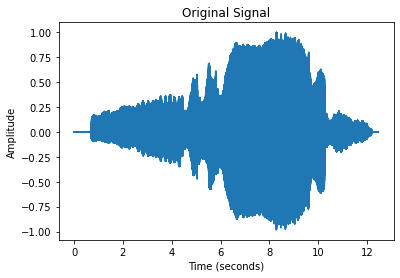

6.233401360544217


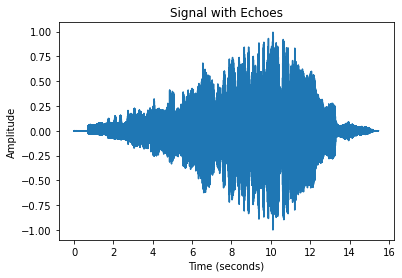

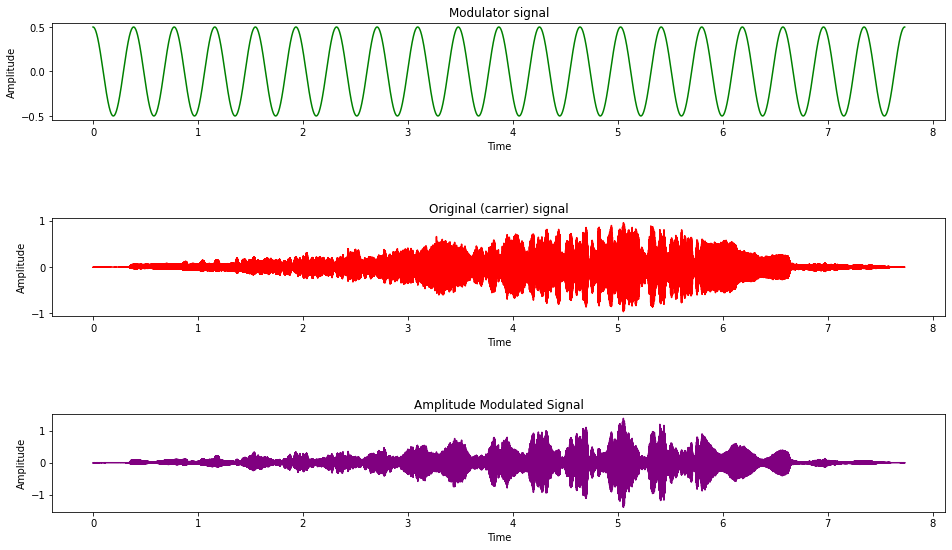

In [12]:
delay = 0.5
echoes = [1,1,1]
modulatorFreq = 20
modulatorAmp = 0.5
modIndex = 1

modSignal1 = echoAM(sig,sr,delay,echoes,modulatorFreq,modulatorAmp,modIndex)
IPython.display.Audio(data=modSignal1, rate=sr)

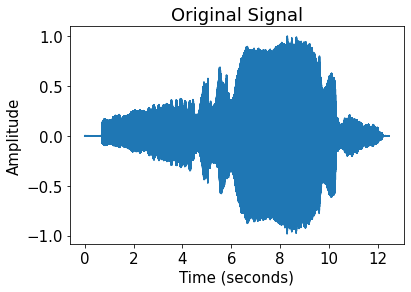

6.233401360544217


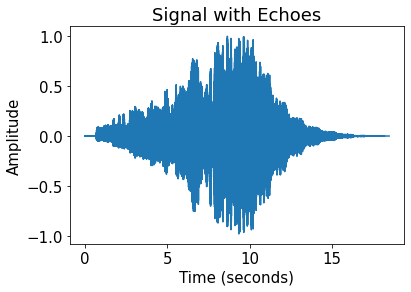

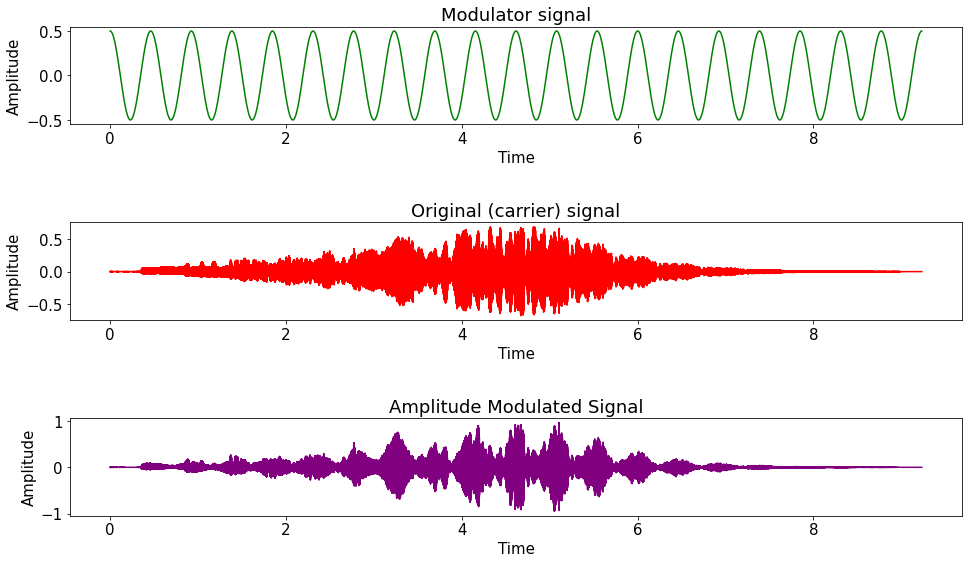

In [13]:
delay = 0.5
echoes = [1,0.5,0.25,0.125,0.0625,0.03125] 
modulatorFreq = 20
modulatorAmp = 0.5
modIndex = 1
modSignal2 = echoAM(sig,sr,delay,echoes,modulatorFreq,modulatorAmp,modIndex)


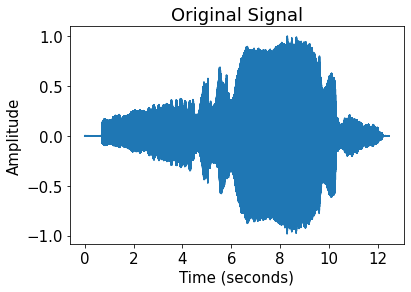

6.233401360544217


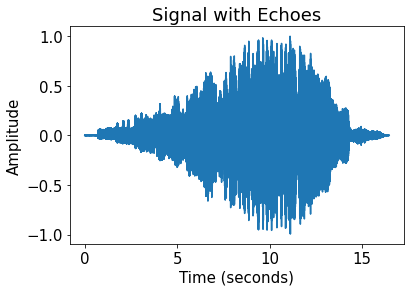

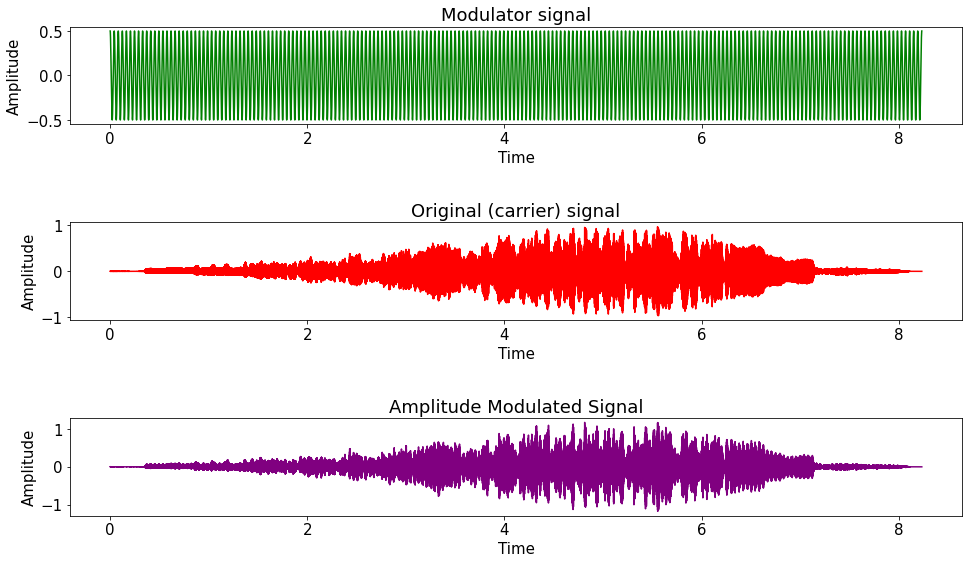

In [14]:
delay = 0.5
echoes = [1,1,1,1] 
modulatorFreq = 200
modulatorAmp = 0.5
modIndex = 0.5
modSignal3 = echoAM(sig,sr,delay,echoes,modulatorFreq,modulatorAmp,modIndex)

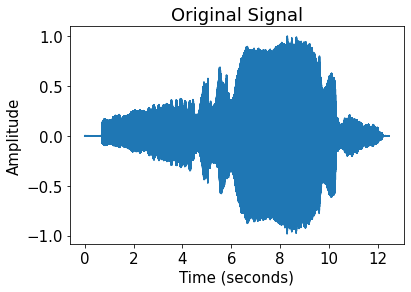

6.233401360544217


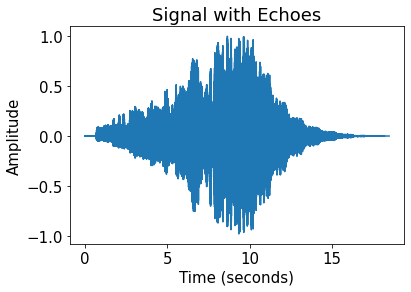

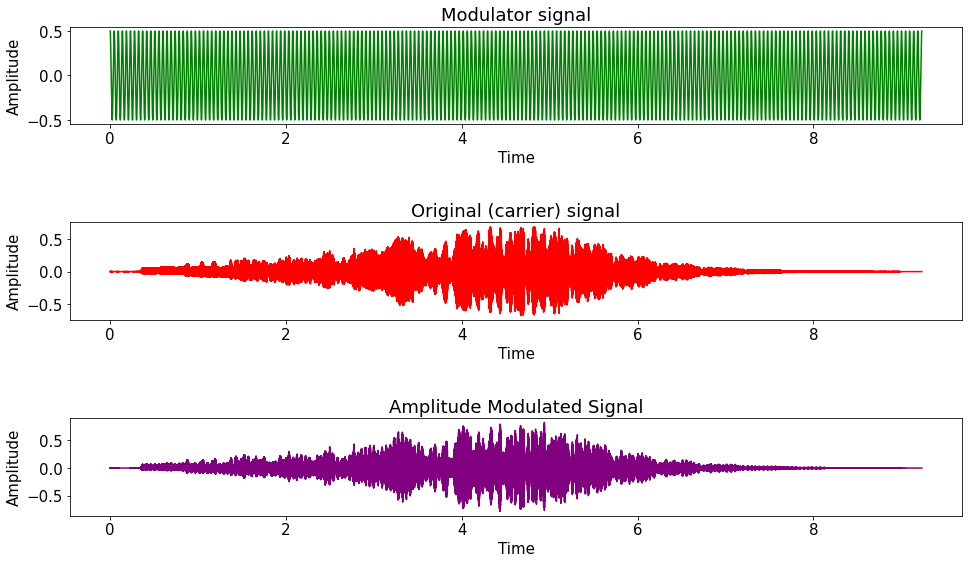

In [15]:
echoes = [1,0.5,0.25,0.125,0.0625,0.03125] 
delay = 0.5
modulatorFreq = 200
modulatorAmp = 0.5
modIndex = 0.5
modSignal4 = echoAM(sig,sr,delay,echoes,modulatorFreq,modulatorAmp,modIndex)

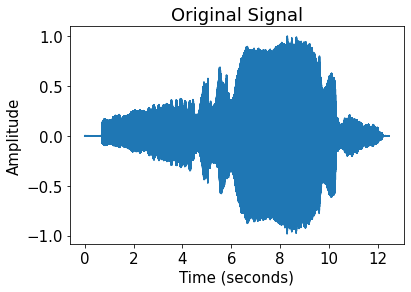

6.233401360544217


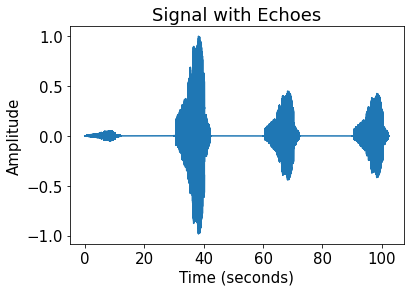

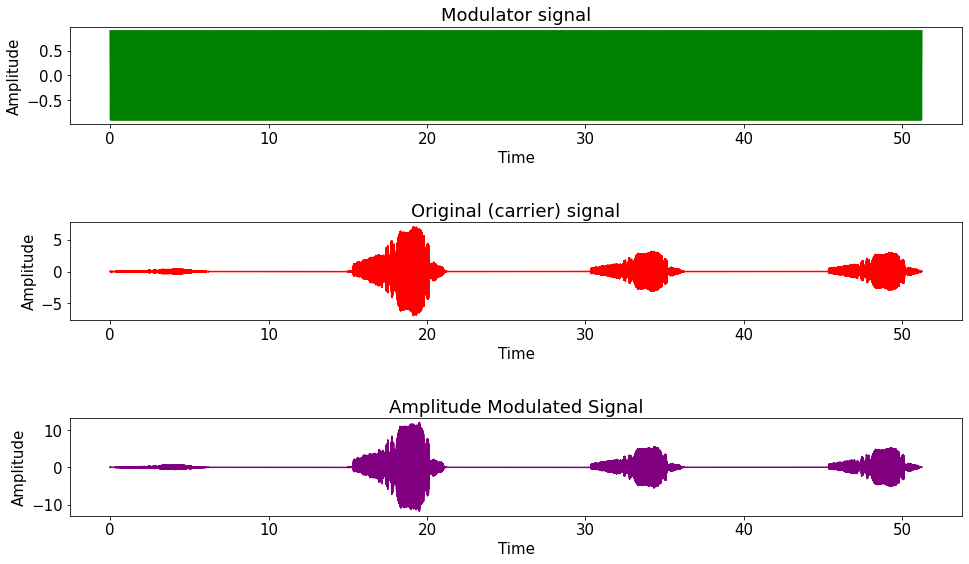

In [18]:
delay = 15
echoes = [20,9,8.5]
modulatorFreq = 1000
modulatorAmp = 0.9
modIndex = 0.9

modSignal5 = echoAM(sig,sr,delay,echoes,modulatorFreq,modulatorAmp,modIndex)
IPython.display.Audio(data=modSignal5, rate=sr)

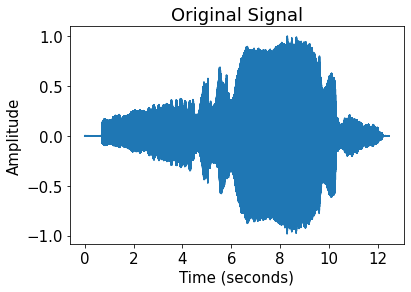

6.233401360544217


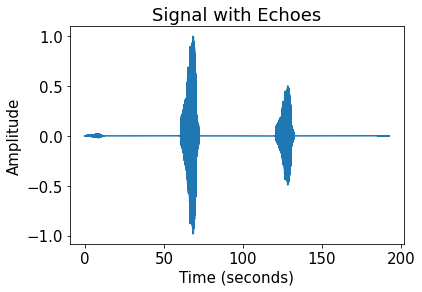

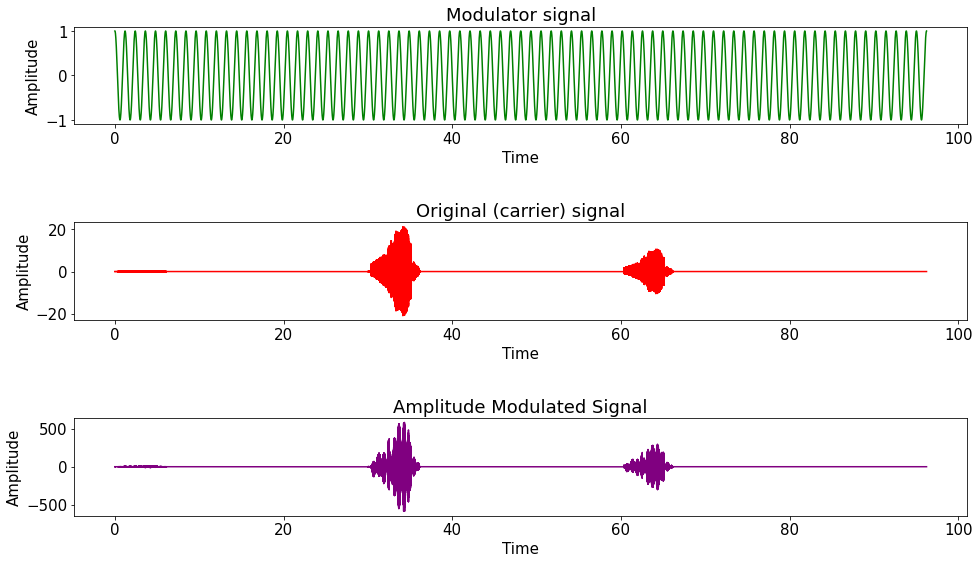

In [17]:
delay = 30
echoes = [60,30,0.1]
modulatorFreq = 80
modulatorAmp = 1.0
modIndex = 30

modSignal6 = echoAM(sig,sr,delay,echoes,modulatorFreq,modulatorAmp,modIndex)
IPython.display.Audio(data=modSignal6, rate=sr)